# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [188]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


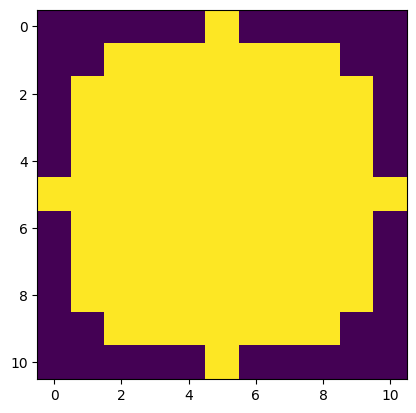

In [189]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1 1]
 [1 1]
 [1 1]
 [1 1]
 [1 1]]


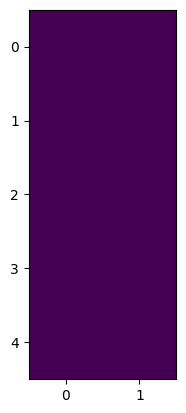

In [190]:
def line_strell(width,length):
  if student :
    strell = np.ones((length, width), dtype=np.uint8)

    # Fill the center column with ones to create a vertical line
  return strell

strell = line_strell(2,5)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

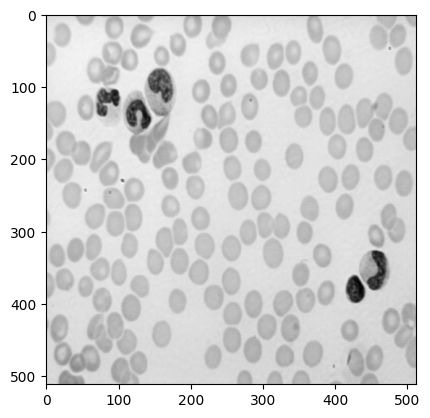

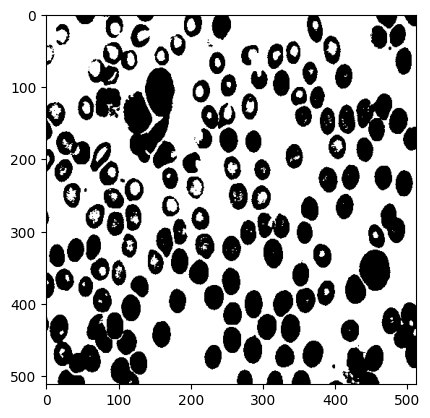

In [191]:
#load the cell image in grayscale and display it 
import cv2

if student:
  img = skio.imread("cell.tif")
  plt.imshow(img, cmap = 'gray')
  plt.show()
  
  _, binary_image = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)
  plt.imshow(binary_image, cmap = 'gray')
  plt.show()
  

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

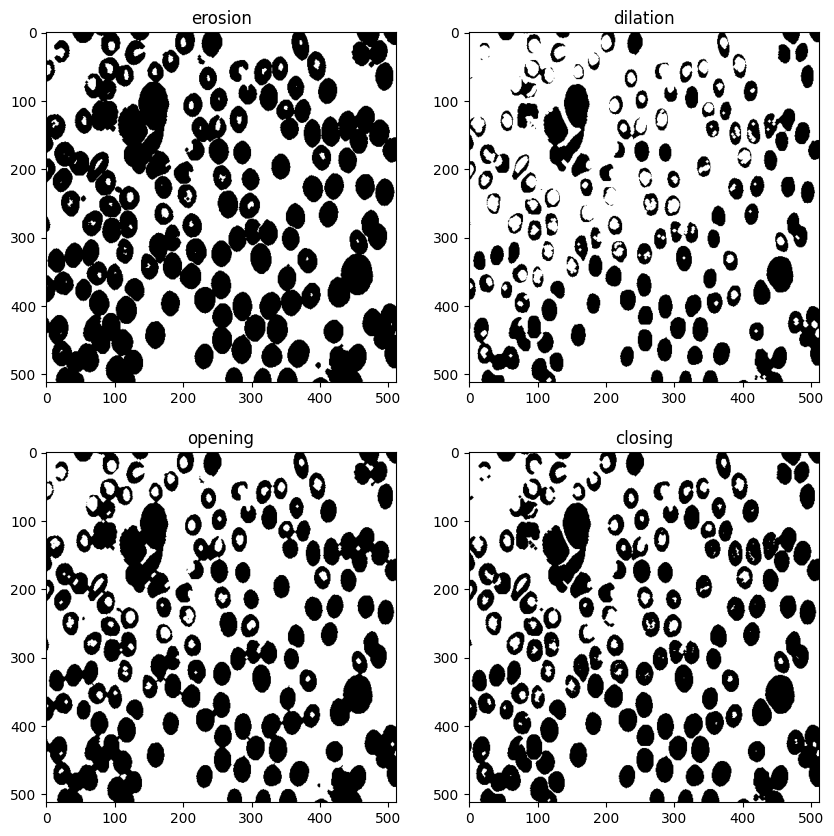

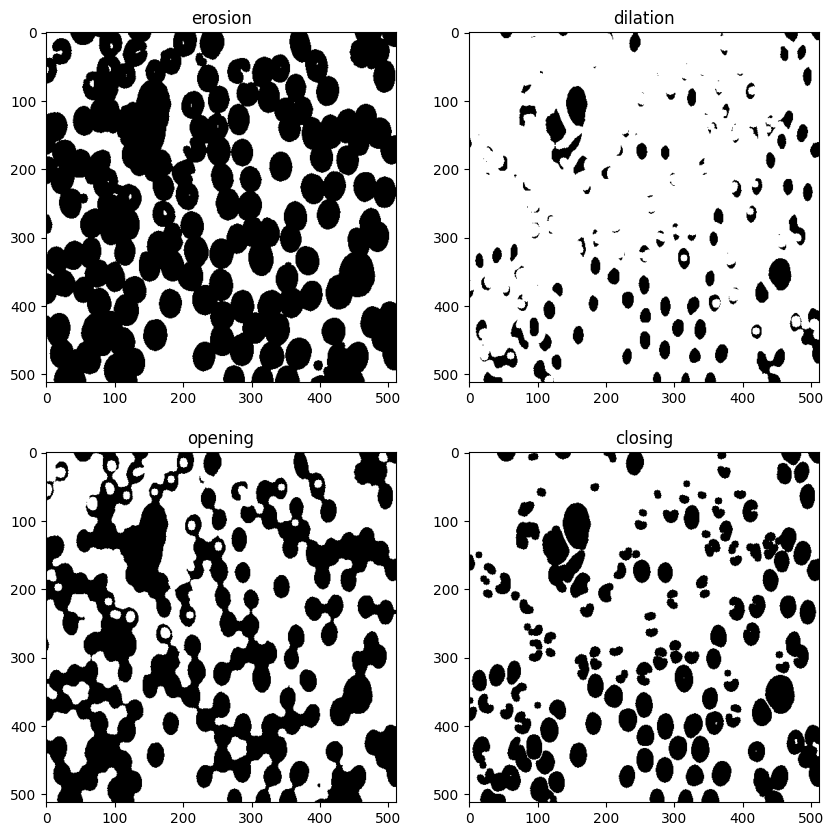

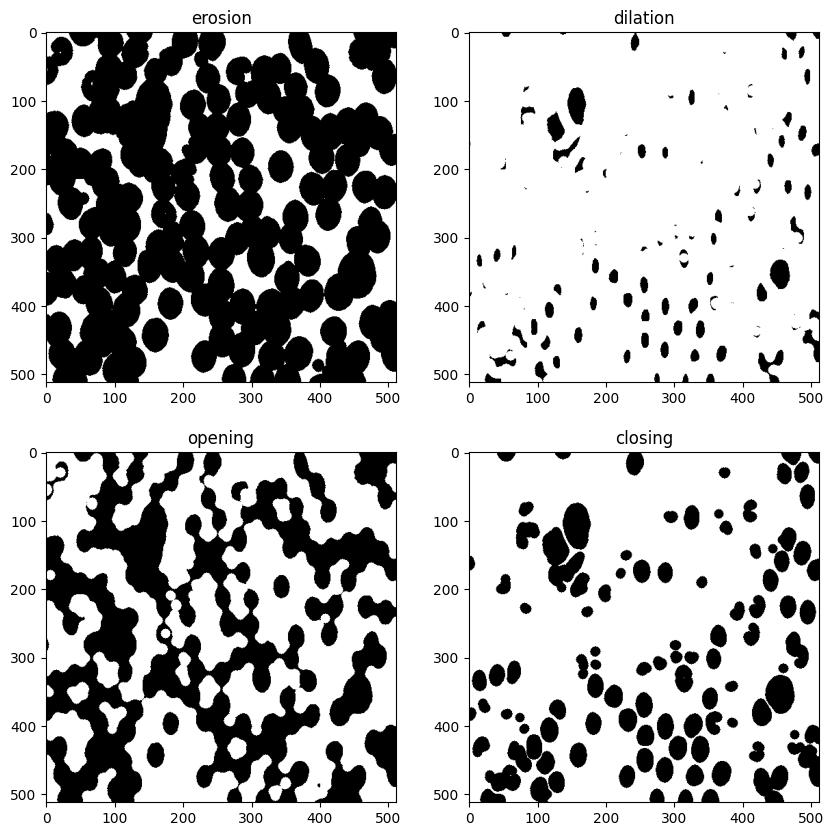

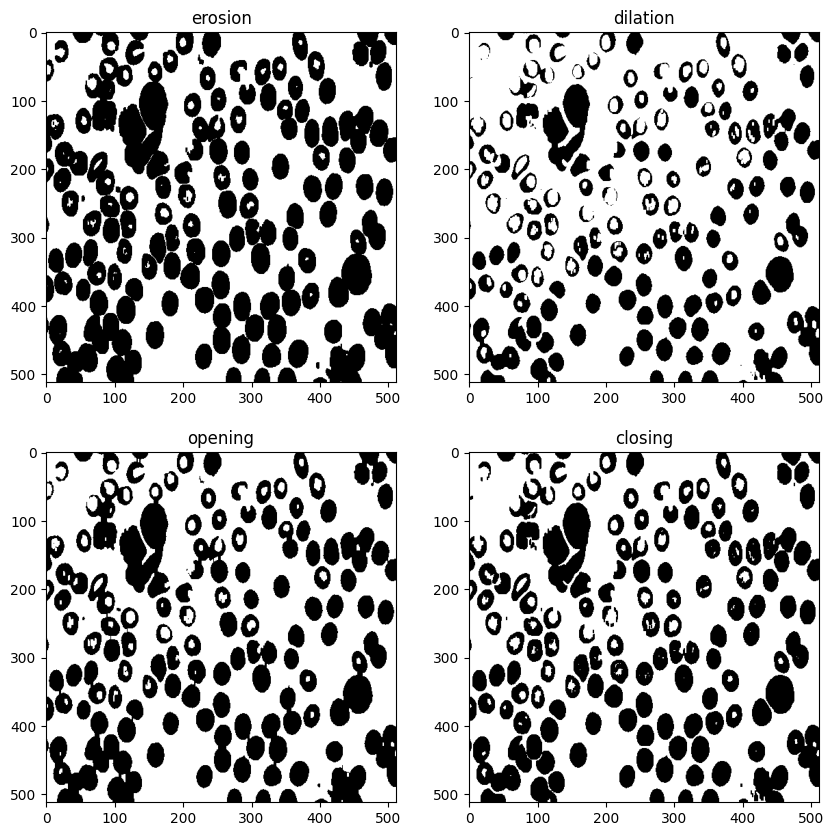

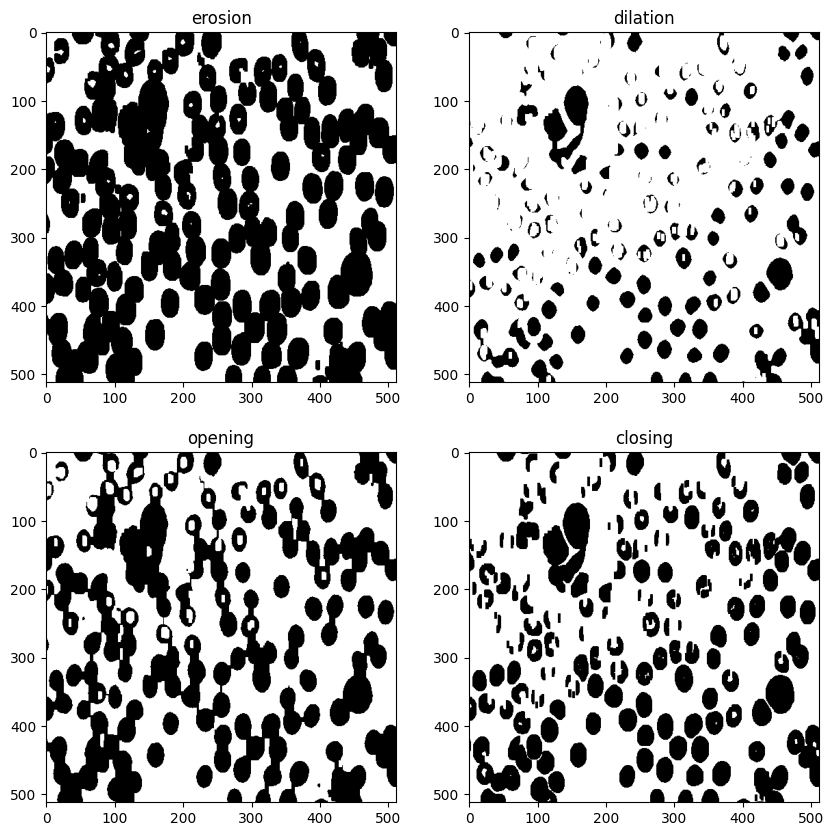

In [192]:
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 2, figsize=(10,10))
imgs = [morpho.erosion(binary_image, strell), morpho.dilation(binary_image, strell), morpho.opening(binary_image, strell),morpho.closing(binary_image, strell)]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()
strell = morpho.disk(5)
fig,ax = plt.subplots(2, 2, figsize=(10,10))
imgs = [morpho.erosion(binary_image, strell), morpho.dilation(binary_image, strell), morpho.opening(binary_image, strell),morpho.closing(binary_image, strell)]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()
strell = morpho.disk(7)
fig,ax = plt.subplots(2, 2, figsize=(10,10))
imgs = [morpho.erosion(binary_image, strell), morpho.dilation(binary_image, strell), morpho.opening(binary_image, strell),morpho.closing(binary_image, strell)]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

# try your own structuring elements and make the size vary
if student :
  strell = line_strell(2,5)
  fig,ax = plt.subplots(2, 2, figsize=(10,10))
  imgs = [morpho.erosion(binary_image, strell), morpho.dilation(binary_image, strell), morpho.opening(binary_image, strell),morpho.closing(binary_image, strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  
  strell = line_strell(4,10)
  fig,ax = plt.subplots(2, 2, figsize=(10,10))
  imgs = [morpho.erosion(binary_image, strell), morpho.dilation(binary_image, strell), morpho.opening(binary_image, strell),morpho.closing(binary_image, strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()


  ...

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The shape of the structuring elements acts, as a morpholigical filter, in a lattice of an image in a similar way of a convolution. Thus, the shpae of the structuring elements should have a common shape compared with the element of the image that we would like to analize. As we can see by the above experiments, the circular element extracted better the circles, due to the isotropy in the shape of the cells.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : In a analogous way as the above answer, the best results to ectract the cells implies that the size of the structuring element should be similar to the size of the cells.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


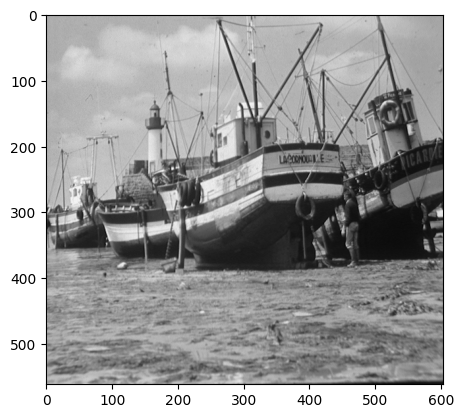

In [193]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("bat.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

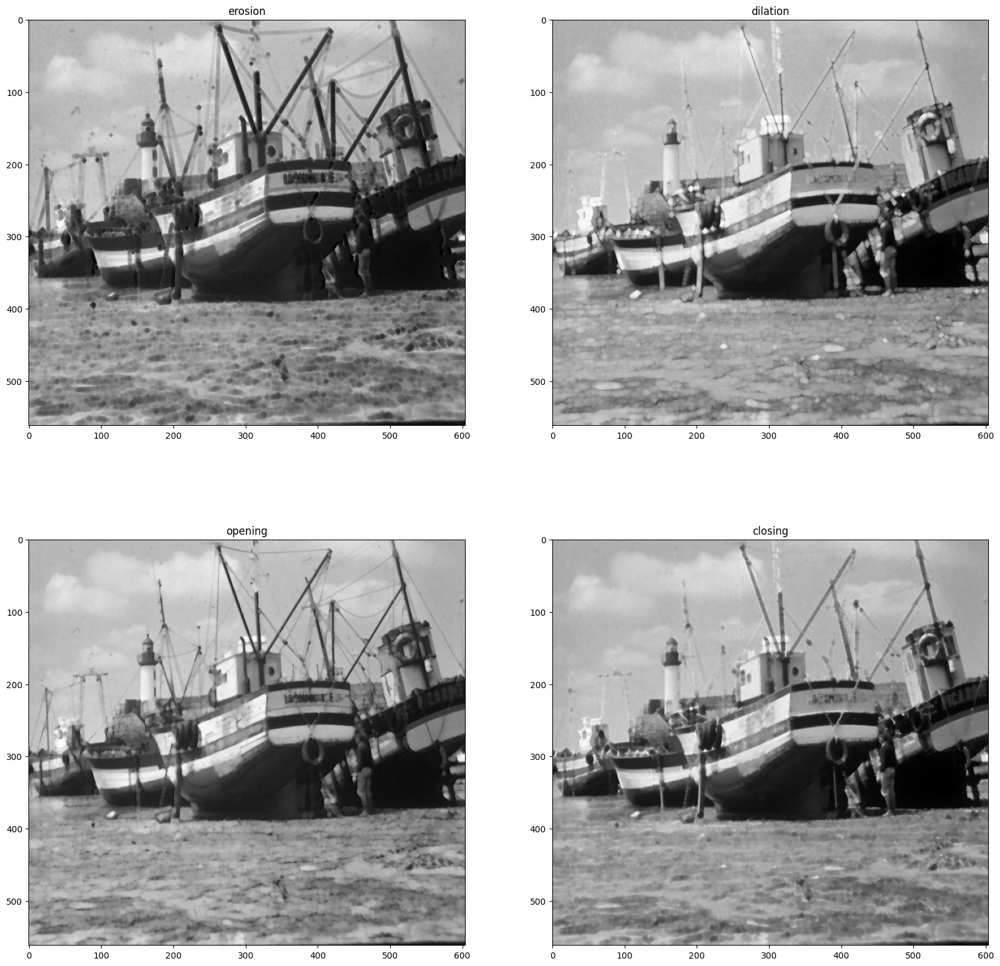

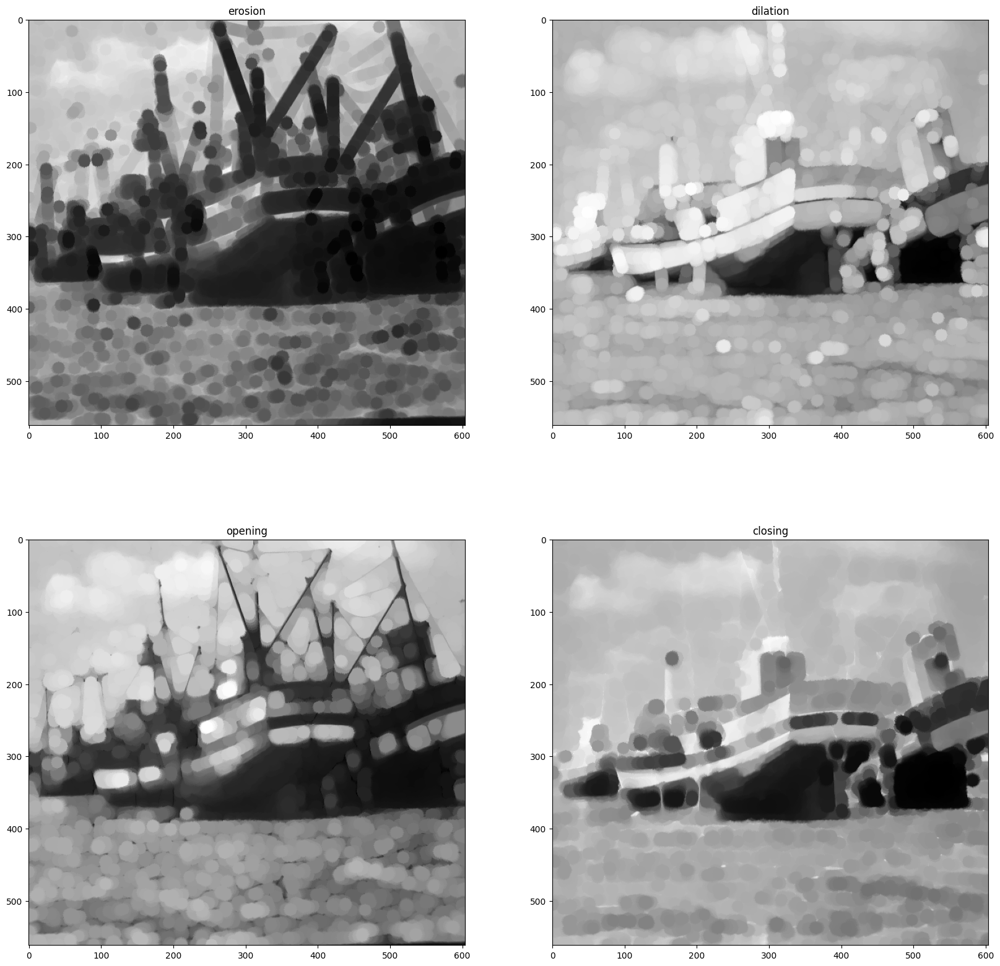

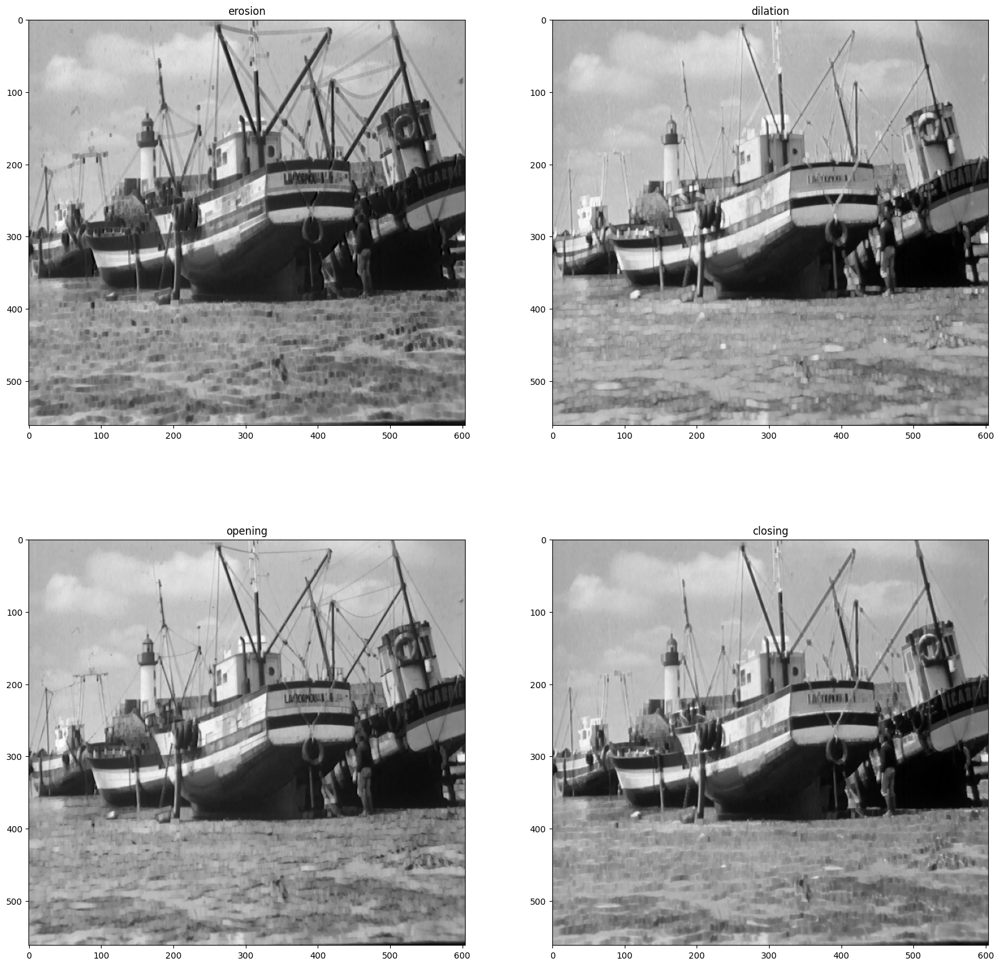

In [194]:
if student:
  ### start code
  strell = morpho.disk(2)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img, strell), morpho.dilation(img, strell), morpho.opening(img, strell),morpho.closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  
  strell = morpho.disk(8)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img, strell), morpho.dilation(img, strell), morpho.opening(img, strell),morpho.closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  
  strell = strell = line_strell(2,5)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img, strell), morpho.dilation(img, strell), morpho.opening(img, strell),morpho.closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

  ### end code

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : In greyscale images the union and the intersection become sup and inf operators, and in an  analouguos way, the kernel of the structuring element performs a non linear operation over the pixels in the area. So, imilar to the previous questions, the shape and the size of the structuring elements determine qhich feature of the original images we would like to extract.

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : The iterativity property can be written as:
$$D(D(X, B), B') = D(X, B \bigoplus B')$$

, where $\bigoplus$ is the Minkowski sum
 So in this case the Minkowski sum of a circle with radius 2 with a circle of radius 3, returns exactly a circle of radius 5. So, do this process in sequence should return the same values for the two operations. 
 Problably, we cannot see exactly the same result because the circle is discretized, and not continous.


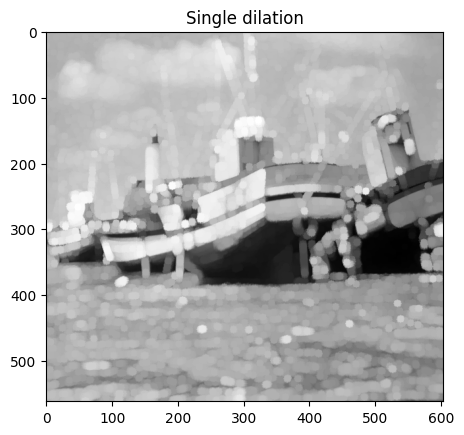

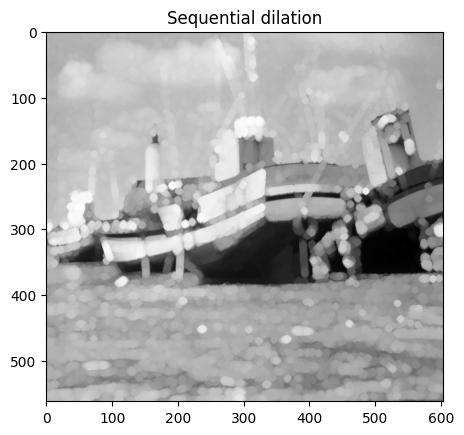

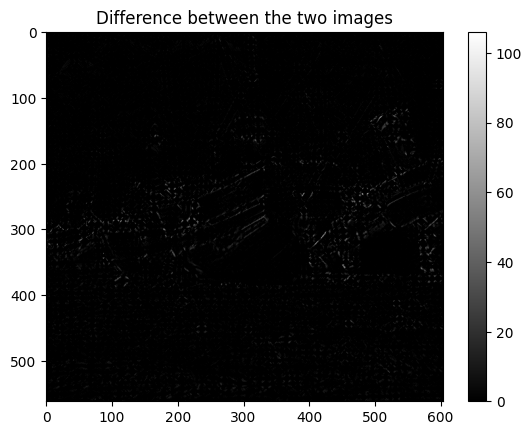

4966894


In [195]:
if student:
  ### start code
  dilation = morpho.dilation(img, morpho.disk(5))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(img, morpho.disk(2))
  dilation_sequential_dilation = morpho.dilation(sequential_dilation, morpho.disk(3))
  
  plt.imshow(dilation_sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
  

  plt.imshow(np.abs(dilation-dilation_sequential_dilation),cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** Plot the result of an opening by a disk structuring element of size 2 followed by
an opening by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** We can write $D$ operator as a minkowiski sum. If we consider $B$ the structuring element of size 2 and $B'$ the structuring element of size 3 we have:

$$D(B, B') = B\bigoplus B'$$
Thus, $$D(X, D(B, B')) = D(X, B\bigoplus B') = X \bigoplus B\bigoplus B'$$

And $$D(D(X, B), B') = D((X \bigoplus B), B') = X \bigoplus B\bigoplus B'$$

Same results.

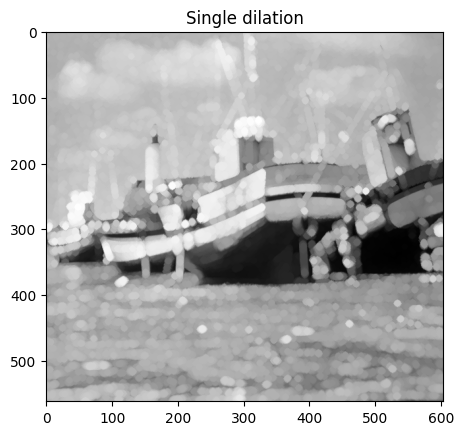

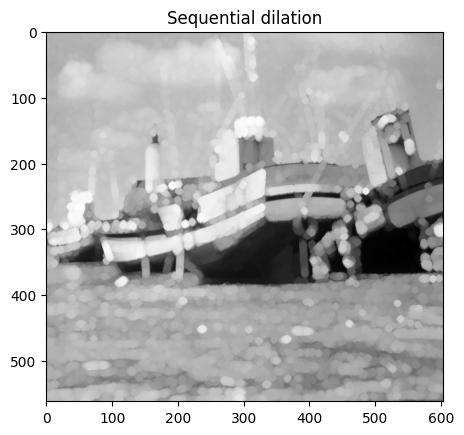

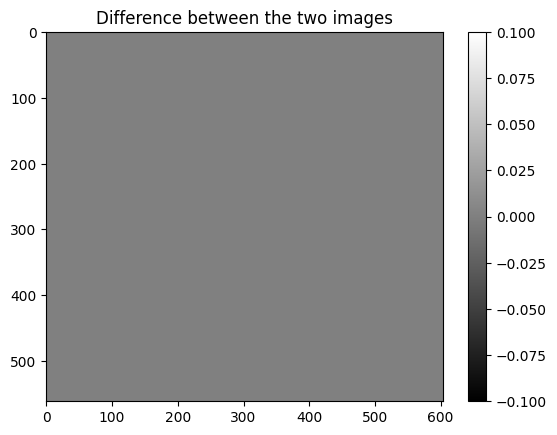

0


In [196]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell, 3)
  sqr_strell = morpho.dilation(sqr_strell, morpho.disk(3))
  #print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img, sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img, morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
    
  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.

$$(X_B)_B = X_B$$


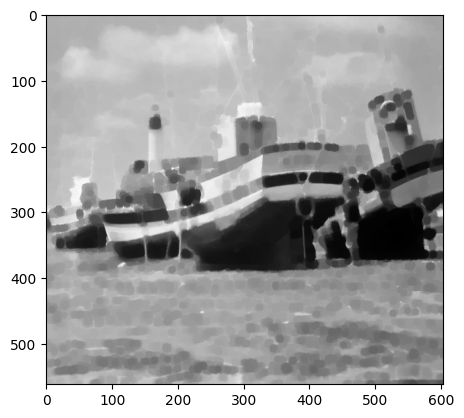

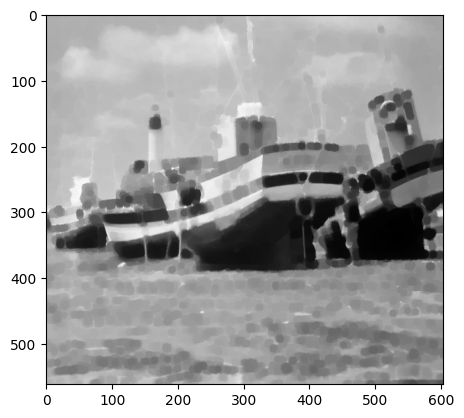

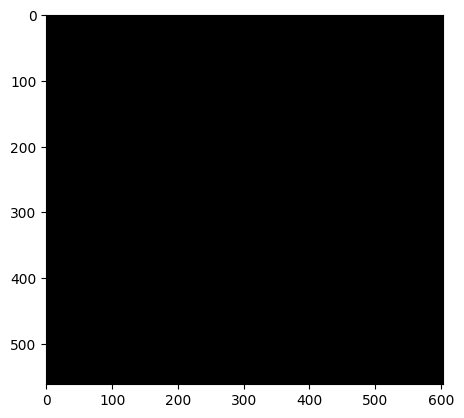

0


In [197]:
if student :
  ### start code
  closed_once = morpho.closing(img, morpho.disk(5))
  plt.imshow(closed_once, cmap='gray')
  plt.show()
  
  closed_twice = morpho.closing(img, morpho.disk(5))
  plt.imshow(closed_twice, cmap='gray')
  plt.show()
  
  plt.imshow(closed_twice - closed_once, cmap='gray')
  plt.show()
  
  print(np.sum(np.abs(closed_twice - closed_once)))
  ### end code

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** :  Opening is defined as a erosion followed by a dilation. So, we elimine the elements brigthers than the neighbors pixels, in which are smaller than the structuring element, because eroding an means applying the $\inf$ operator. Ten the dilation, in sequence, makes the image simillar to the originnal one with exception opf the elements erased in the previous operation. 

So, when we realize a subtraction of the original image and the oppening, we highlight the brighters and thin elements in comparission to the structure element.

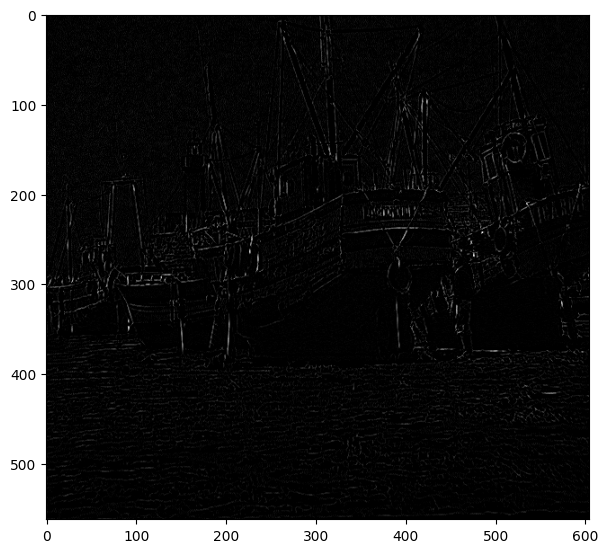

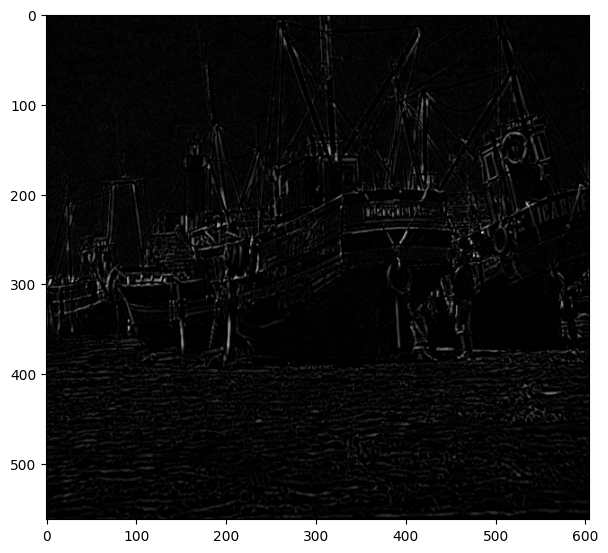

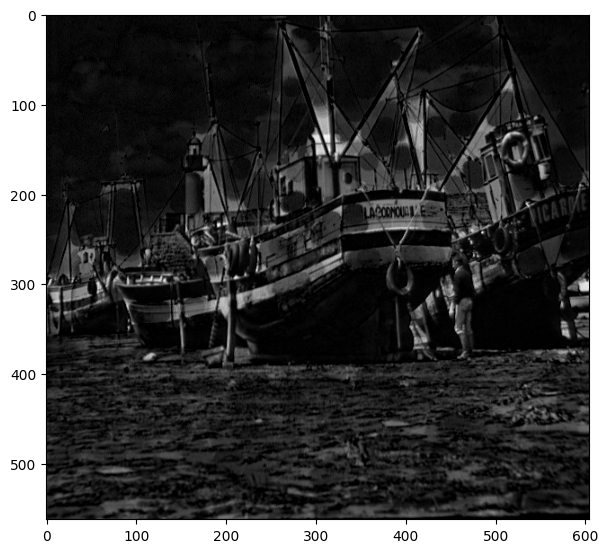

In [198]:
if student:
  ### start code
  top_hat = img -  morpho.opening(img, morpho.disk(1))
  plt.figure(figsize = (7,7))
  plt.imshow(top_hat,cmap = "gray")
  plt.show()


if student:
  ### start code
  top_hat = img -  morpho.opening(img, morpho.disk(2))
  plt.figure(figsize = (7,7))
  plt.imshow(top_hat,cmap = "gray")
  plt.show()
  
if student:
  ### start code
  top_hat = img -  morpho.opening(img, morpho.disk(10))
  plt.figure(figsize = (7,7))
  plt.imshow(top_hat,cmap = "gray")
  plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : Its analogous to the previous question, excpet that in this time we are highlighting the darker structures that fits inside the structuring element. That happens because closing is dilation followed by erosion, being defined as the dual-operation of opening.

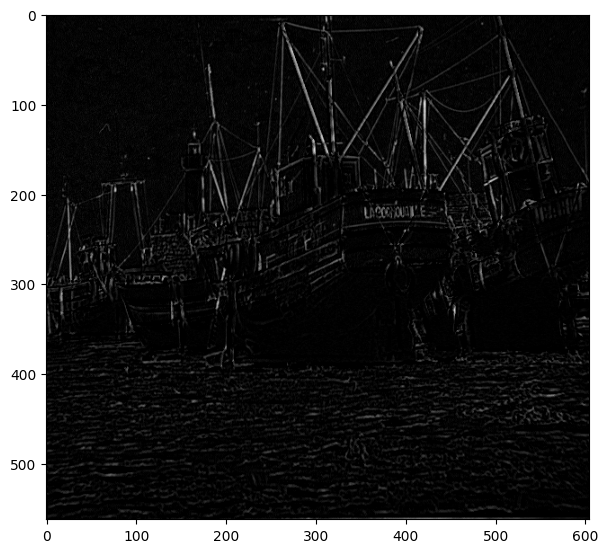

In [199]:
if student:
  ### start code
  strell = morpho.disk(2)
  dual_top_hat = morpho.closing(img, strell) - img
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: As explained in the previous questions, the opening retires brighter structures while the opening retires more the darker ones. So applying both sequentially can retire the noise and filter the outliers of an image, for example.

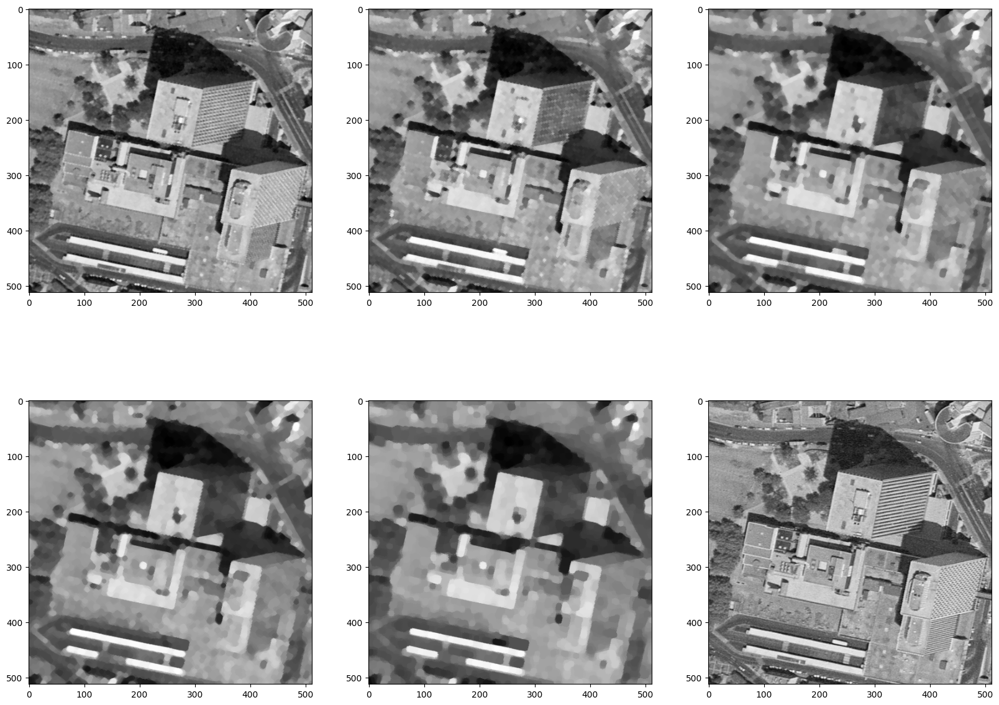

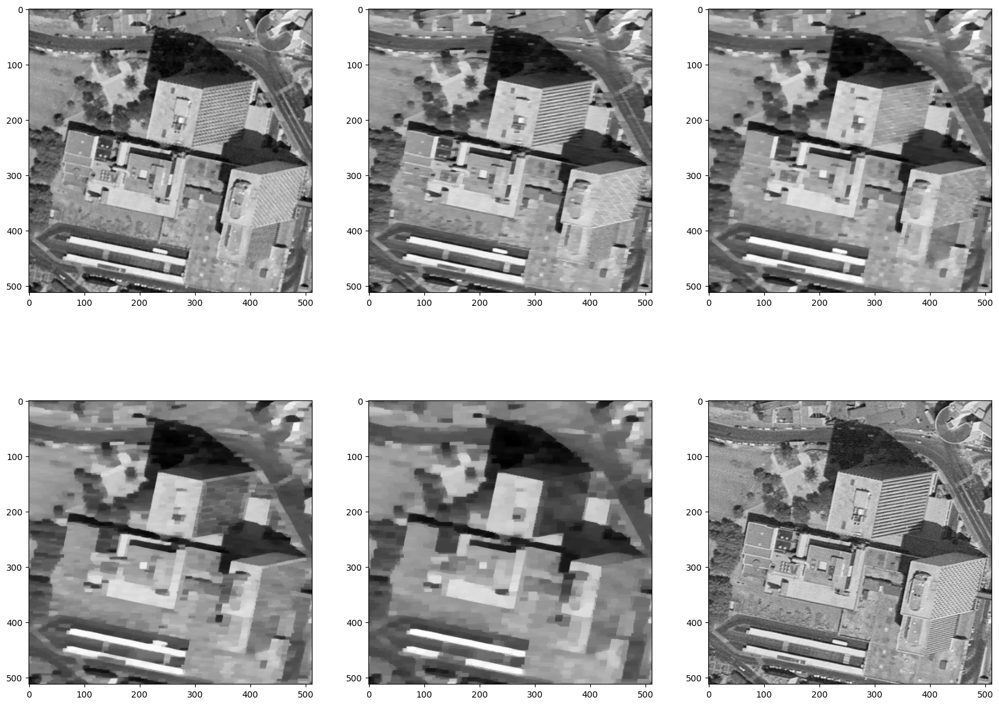

In [200]:
# Example
img = skio.imread("montreuil.tif")

# Structuring elements
se1=morpho.disk(1)
se2=morpho.disk(2)
se3=morpho.disk(3)
se4=morpho.disk(4)
se5=morpho.disk(5)
# Images
fas1= morpho.closing(morpho.opening(img, se1), se1)
fas2= morpho.closing(morpho.opening(img, se2), se2)
fas3= morpho.closing(morpho.opening(img, se3), se3)
fas4= morpho.closing(morpho.opening(img, se4), se4)
fas5= morpho.closing(morpho.opening(img, se5), se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

#Try you own
if student :
  se1=morpho.disk(1)
  se2=morpho.rectangle(2,5)
  se3=morpho.rectangle(3, 6)
  se4=morpho.rectangle(4,10)
  se5=morpho.rectangle(6,12)
  # Images
  fas1= morpho.closing(morpho.opening(img, se1), se1)
  fas2= morpho.closing(morpho.opening(img, se2), se2)
  fas3= morpho.closing(morpho.opening(img, se3), se3)
  fas4= morpho.closing(morpho.opening(img, se4), se4)
  fas5= morpho.closing(morpho.opening(img, se5), se5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1,1].imshow(fas5,cmap = "gray")
  ax[1,2].imshow(img,cmap = "gray")
  plt.show()
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: (code in the following cell) 
The result of the morpholical gradient highlights the contours of the cells. This is similar to the norm of the regular gradient.

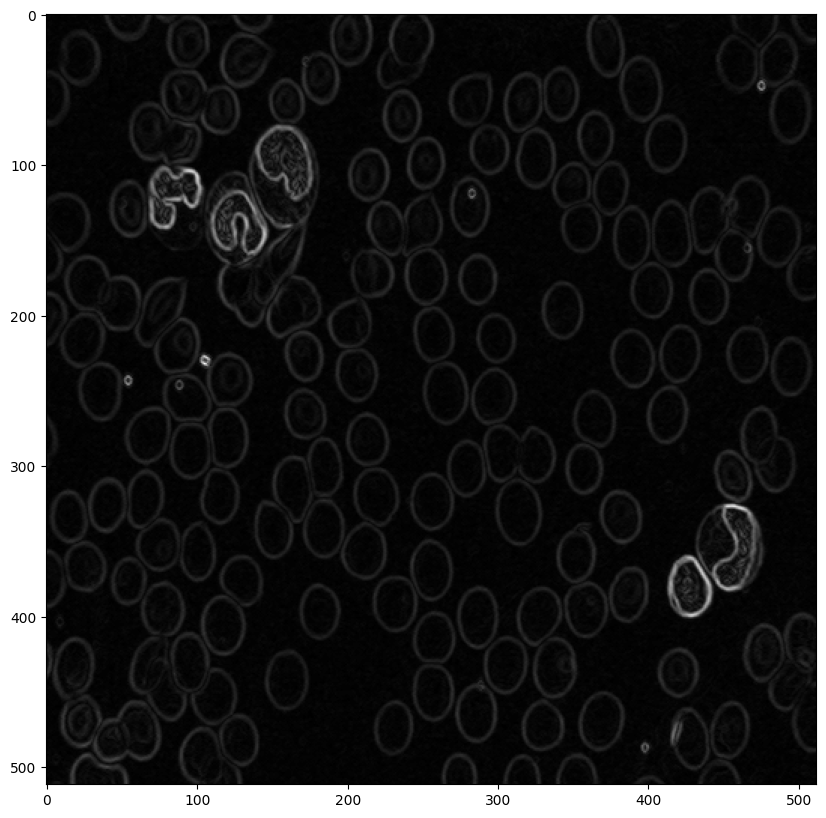

In [201]:
if student : 
  img = skio.imread("cell.tif")
  erosion = morpho.erosion(img, morpho.disk(1))
  dilation = morpho.dilation(img, morpho.disk(1))
  morpho_grad = dilation - erosion
  plt.figure(figsize=(10,10))
  plt.imshow(morpho_grad,cmap = "gray")
  plt.show()

- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : (code in the next cell)
As we can see in the previous question the morphological gradient contours even the smaller contours, so it makes that when we threshold it, it captures undesired patterns.

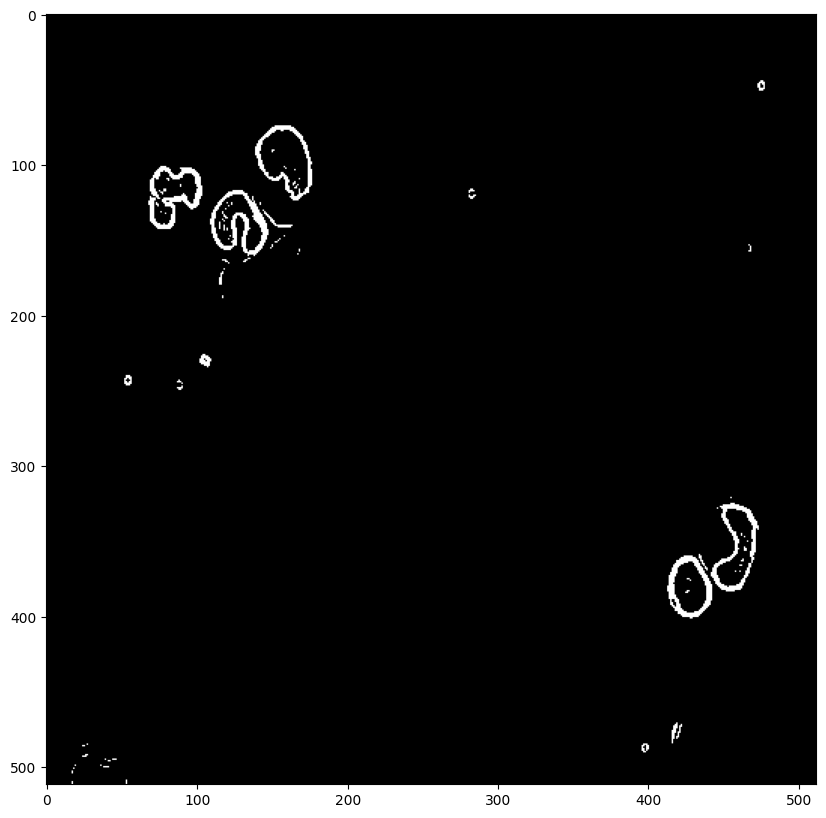

In [202]:
if student : 
  img = skio.imread("cell.tif")
  
  _,binary_image = cv2.threshold(morpho_grad, 25, 255, cv2.THRESH_BINARY)
  plt.figure(figsize=(10,10))
  plt.imshow(binary_image,cmap = "gray")
  plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell) 
The idea of the watershed algorithm is to find out basins of an image, which means, find out pixels that shares the same local minima(based on intensity) in a region. So we can visualize the colors of the regions and their contours.
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) The parameter represent the number of bassins we are trying to find out with the watershed method. So, It's necessary find a an optimal value in order to don't capturate noises and still ger the desired region.

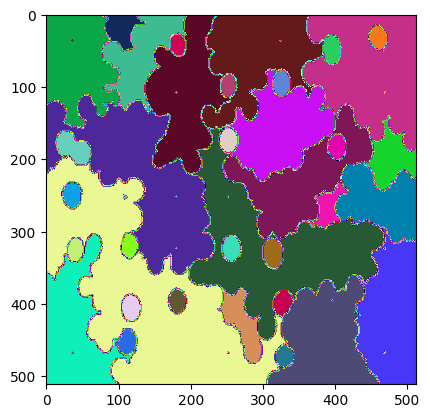

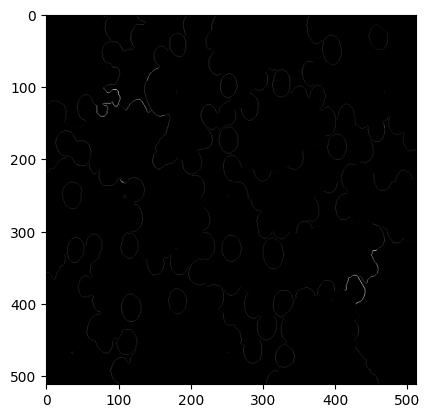

In [203]:
import matplotlib
from skimage.feature import peak_local_max
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = seg.watershed(morpho_grad, markers =50, watershed_line=True)
  plt.imshow(wat, cmap =cmaprand)
  plt.show()
  
  morpho_grad_w_edges = np.copy(morpho_grad)
  morpho_grad_w_edges[wat == 0] = 0
  
  plt.imshow(morpho_grad-morpho_grad_w_edges, cmap='gray')
  plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) 
It seems that for high values of markers that we start to see some structures that were not merged in the original image and making perceptible the details of some borders.

- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) 
The result seems worse than the previous operations, but it seems to help in delete fake conexions beetween the cells generate by noise.


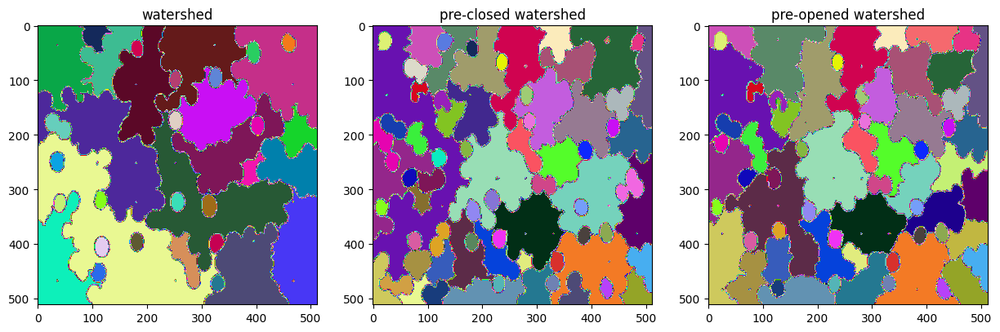

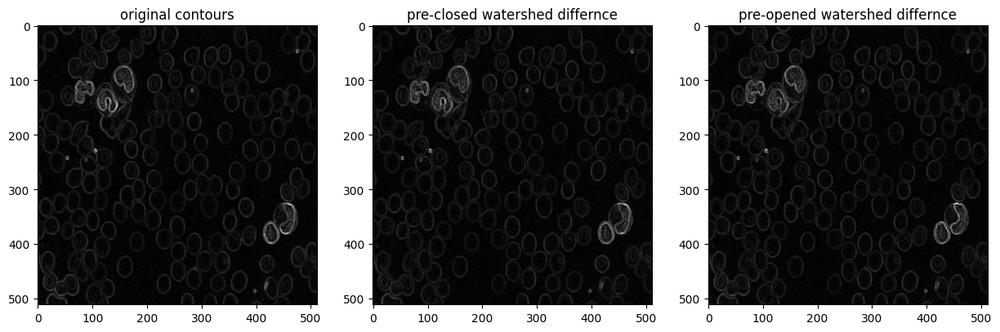

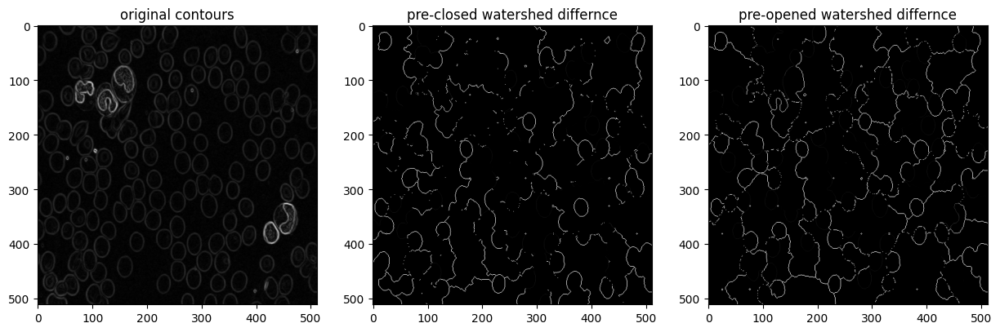

In [204]:
wat_closing = seg.watershed(morpho.closing(morpho_grad, morpho.disk(2)), markers = 100, watershed_line=True)

wat_opening = seg.watershed(morpho.opening(morpho_grad, morpho.disk(2)), markers = 100, watershed_line=True)

morpho_grad_opening = np.copy(morpho_grad)
morpho_grad_opening[wat_opening == 0] = 0

morpho_grad_closing = np.copy(morpho_grad)
morpho_grad_closing[wat_closing == 0] = 0

fig, axes = plt.subplots(1,3, figsize=(15,5))
axes[0].imshow(wat, cmap=cmaprand)
axes[0].set_title('watershed')
axes[1].imshow(wat_closing, cmap=cmaprand)
axes[1].set_title('pre-closed watershed')
axes[2].imshow(wat_opening, cmap=cmaprand)
axes[2].set_title('pre-opened watershed')
plt.show()

fig, axes = plt.subplots(1,3, figsize=(15,5))
axes[0].imshow(morpho_grad_w_edges, cmap='gray')
axes[0].set_title('original contours')
axes[1].imshow(morpho_grad_closing, cmap='gray')
axes[1].set_title('pre-closed watershed differnce')
axes[2].imshow(morpho_grad_opening , cmap='gray')
axes[2].set_title('pre-opened watershed differnce')
plt.show()
  
fig, axes = plt.subplots(1,3, figsize=(15,5))
axes[0].imshow(morpho_grad, cmap='gray')
axes[0].set_title('original contours')
axes[1].imshow(morpho_grad_closing - morpho_grad_w_edges, cmap='gray')
axes[1].set_title('pre-closed watershed differnce')
axes[2].imshow(morpho_grad_opening - morpho_grad_w_edges, cmap='gray')
axes[2].set_title('pre-opened watershed differnce')
plt.show()


Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** The image seems to have more noise, but the contours has became more defined. The definition of the countours can help in the segmentation.

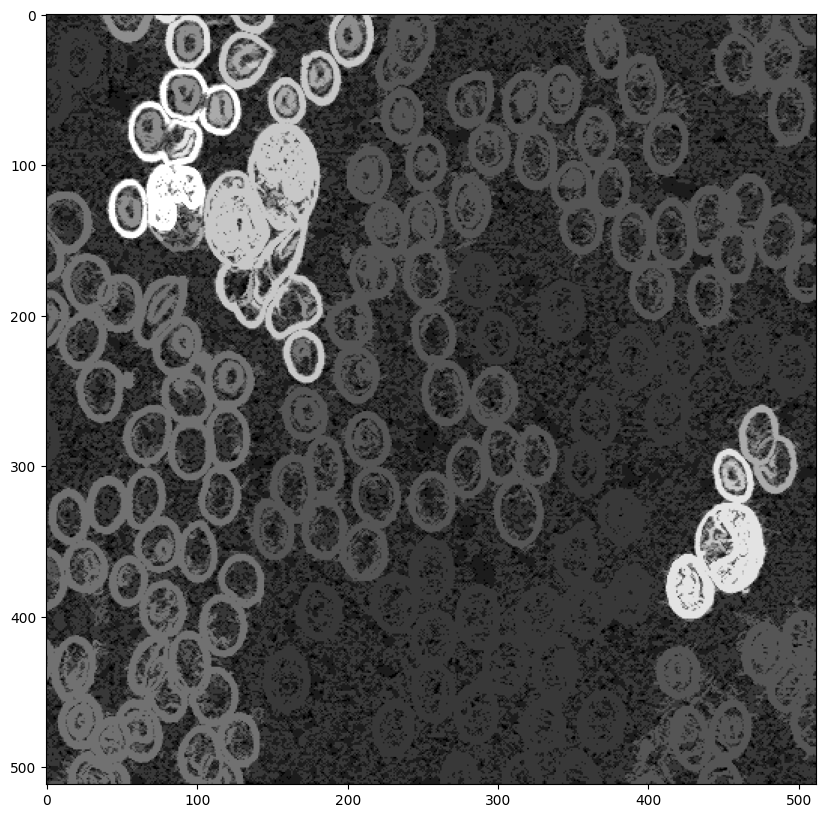

In [205]:
strell = morpho.disk(5)
imOpen = morpho.opening(morpho_grad, strell)
reco = morpho.reconstruction(imOpen, morpho_grad)
plt.figure(figsize =(10,10))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : The borders are more smooth and in overall the image seems more denoised. Again, it might be usefull in segmentation.

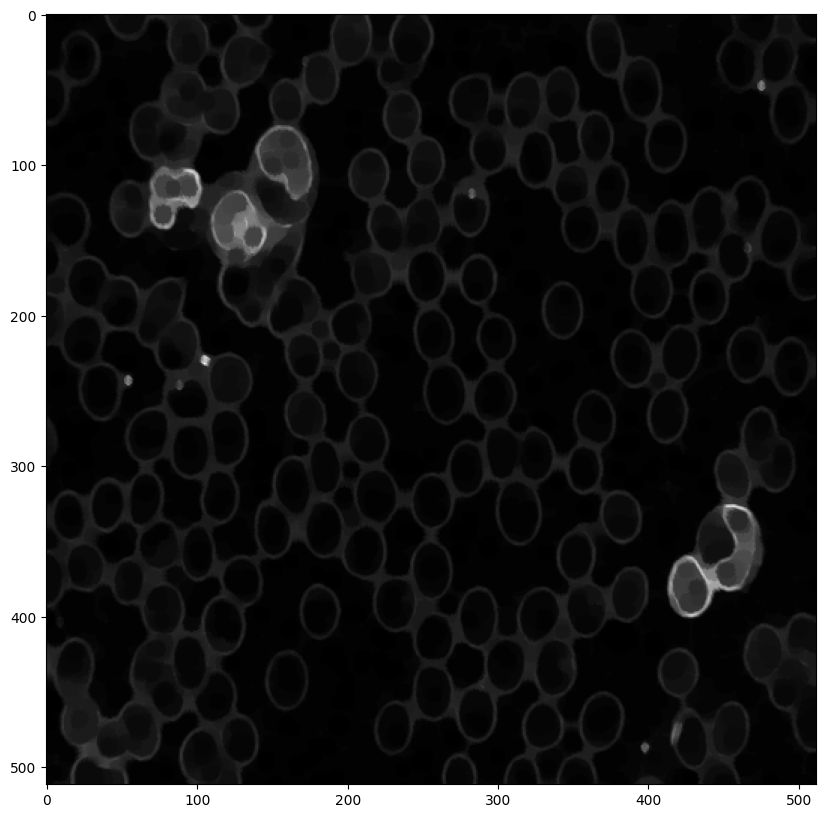

In [206]:
imClos = morpho.closing(morpho_grad, strell)
reco = morpho.reconstruction(morpho_grad, imClos)
plt.figure(figsize =(10,10))
plt.imshow(reco, cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature


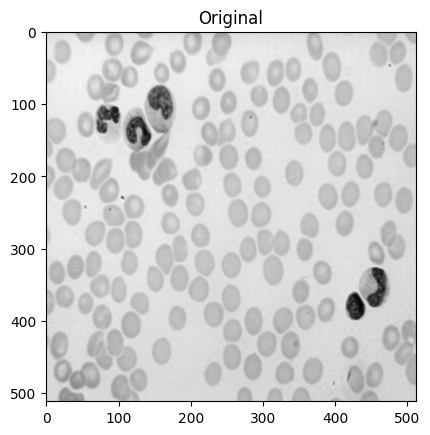

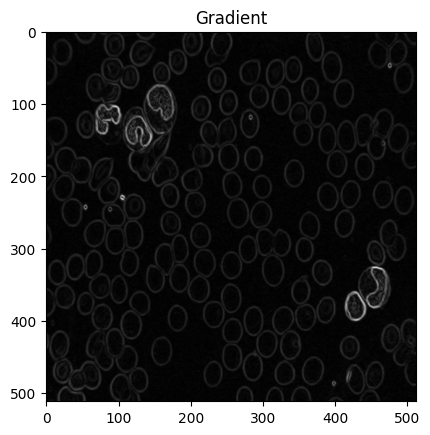

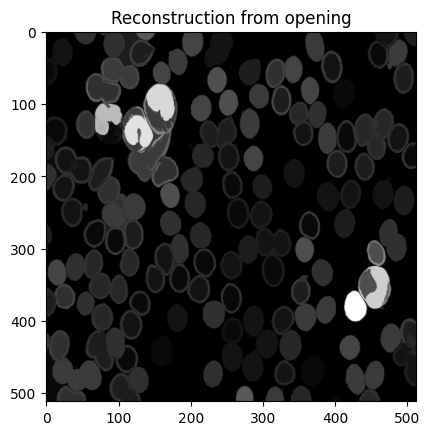

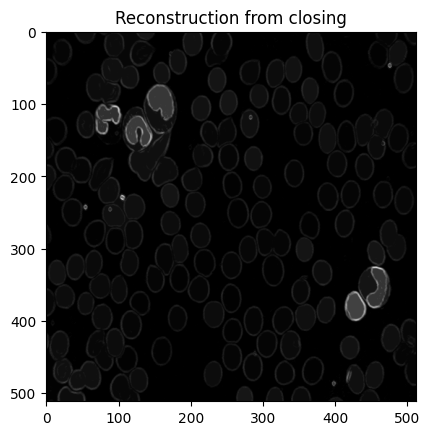

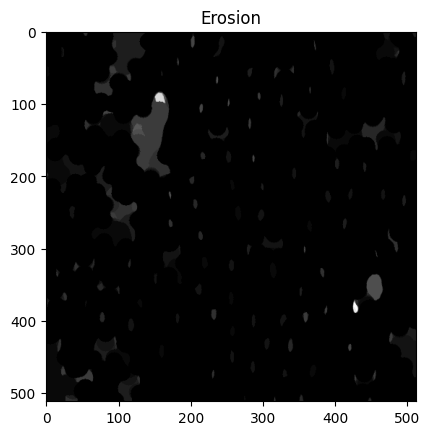

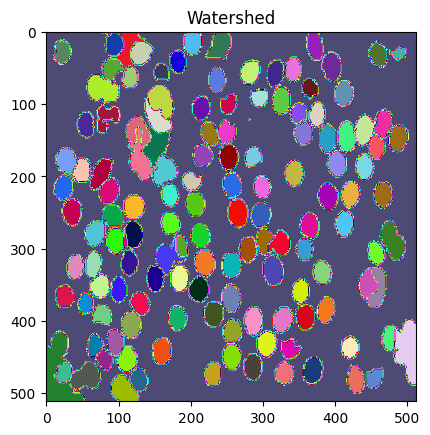

In [253]:
from skimage.feature import peak_local_max

plt.imshow(img, cmap='gray')
plt.title('Original')
plt.show()

strell = morpho.disk(1)
img_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)
plt.imshow(img_grad, cmap='gray')
plt.title("Gradient")
plt.show()

strell = morpho.disk(6)
img_reco2 = morpho.reconstruction(morpho.opening(img_reco, strell), img_reco, method='dilation')
plt.imshow(img_reco2, cmap = "gray")
plt.title('Reconstruction from opening')
plt.show()

strell = morpho.disk(10)
img_reco = morpho.reconstruction(morpho.closing(img_grad, strell), img_grad, method='erosion')
plt.imshow(img_reco,cmap = "gray")
plt.title('Reconstruction from closing')
plt.show()

strell = morpho.disk(12)
img_erosion = morpho.erosion(img_reco2, strell)
plt.imshow(img_erosion, cmap='gray')
plt.title('Erosion')
plt.show()

strell = morpho.disk(20)
markers = peak_local_max(img_erosion, footprint=strell, min_distance=20, threshold_abs=3)
marker_img = np.zeros_like(img)
for k in range(len(markers)):
  marker_img[markers[k][0]][[markers[k][1]]] = k


wat = seg.watershed(img_reco, markers=marker_img, watershed_line=True)
plt.imshow(wat, cmap=cmaprand)
plt.title("Watershed")
plt.show()